In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColumnDataSource
from bokeh.layouts import gridplot
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM
from keras.callbacks import EarlyStopping
import yfinance as yf
import matplotlib.dates as mdates
import csv
import os
import json

In [2]:
GPUS = tf.config.experimental.list_physical_devices('GPU')

In [3]:
for gpu in GPUS:
    tf.config.experimental.set_memory_growth(gpu,True)

In [4]:
# Load config.json
with open('stockconfig.json', 'r') as config_file:
    config = json.load(config_file)

# Paths
tickers_txt_path = config['paths']['tickers_txt']
stocks_csv_path = config['paths']['stocks_csv']
saved_models_folder = config['paths']['saved_models_folder']

# Model Training
retrain_models = config['model_training']['retrain_models']
epochs = config['model_training']['epochs']
batch_size = config['model_training']['batch_size']
patience = config['model_training']['patience']

# Model Architecture
lstm_units = config['model_architecture']['lstm_units']
dense_units = config['model_architecture']['dense_units']

# Data Processing
seq_length = config['data_processing']['seq_length']
start_date = config['data_processing']['start_date']
end_date = config['data_processing']['end_date']

# Visualization
future_periods = config['visualization']['future_periods']
noise_factor = config['visualization']['noise_factor']



In [5]:
# Read tickers from a text file and a CSV file
tickers = []

# Read from a text file
try:
    with open(tickers_txt_path, 'r') as f:
        tickers.extend([line.strip() for line in f.readlines()])
except FileNotFoundError:
    print("tickers.txt file not found.")

# Read from a CSV file
try:
    with open(stocks_csv_path, 'r') as f:
        reader = csv.reader(f)
        tickers.extend([row[0] for row in reader])
except FileNotFoundError:
    print("tickers.csv file not found.")



tickers.csv file not found.


In [6]:
# Remove duplicates
tickers = list(set(tickers))

data = {}
scaled_data = {}
train_data = {}
test_data = {}

for ticker in tickers:
    data_df = yf.Ticker(ticker)
    data[ticker] = data_df.history(start=start_date, end=end_date)['Close']
    scaler = MinMaxScaler()
    scaled_data[ticker] = scaler.fit_transform(data[ticker].values.reshape(-1, 1))

    # Split the data into training and testing sets
    train_size = int(len(scaled_data[ticker]) * 0.8)
    train_data[ticker] = scaled_data[ticker][:train_size]
    test_data[ticker] = scaled_data[ticker][train_size:]



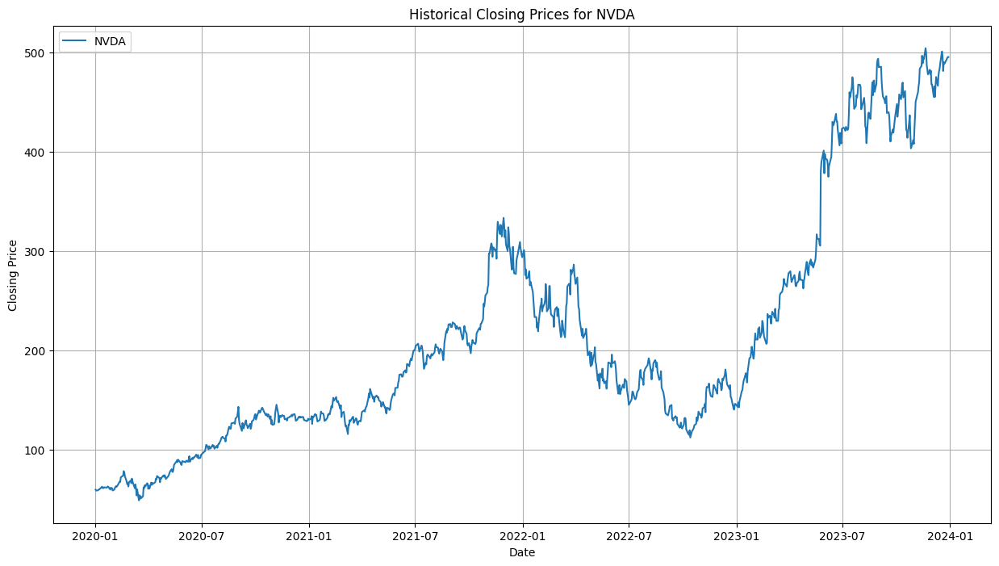

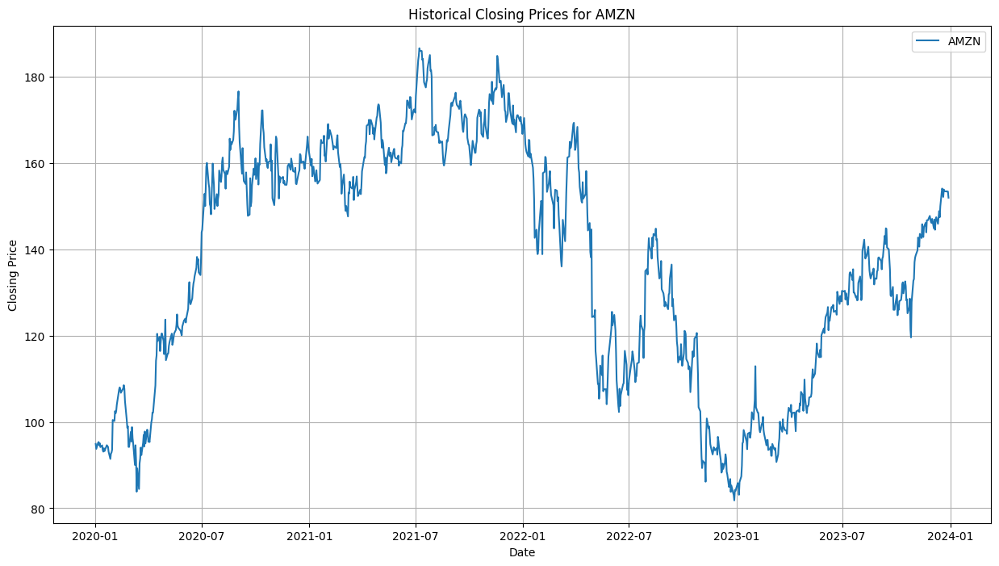

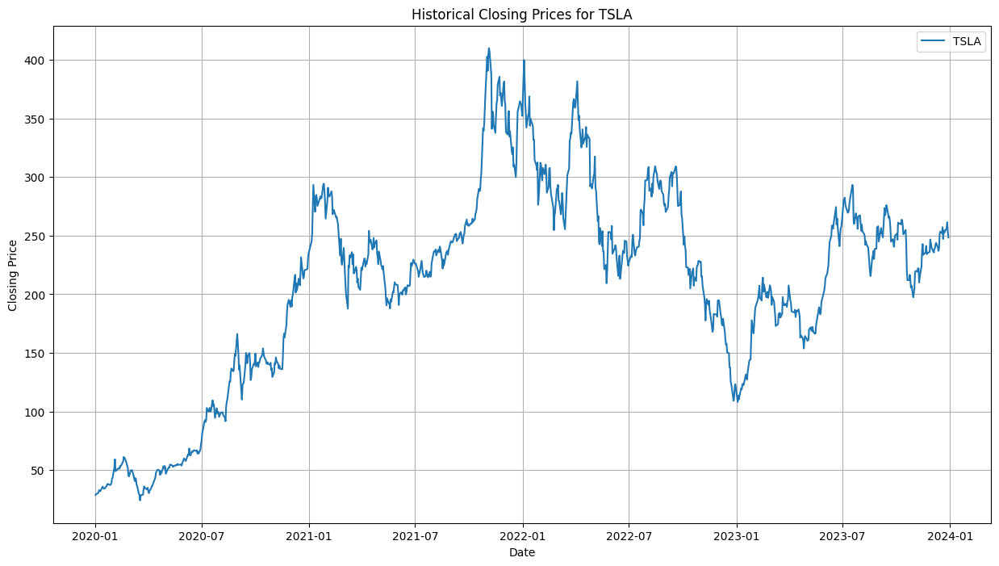

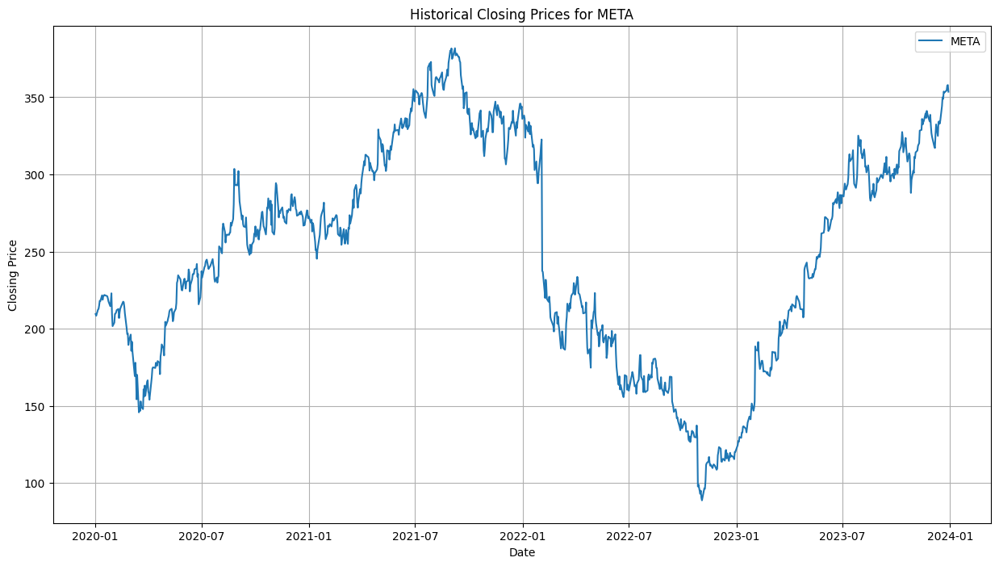

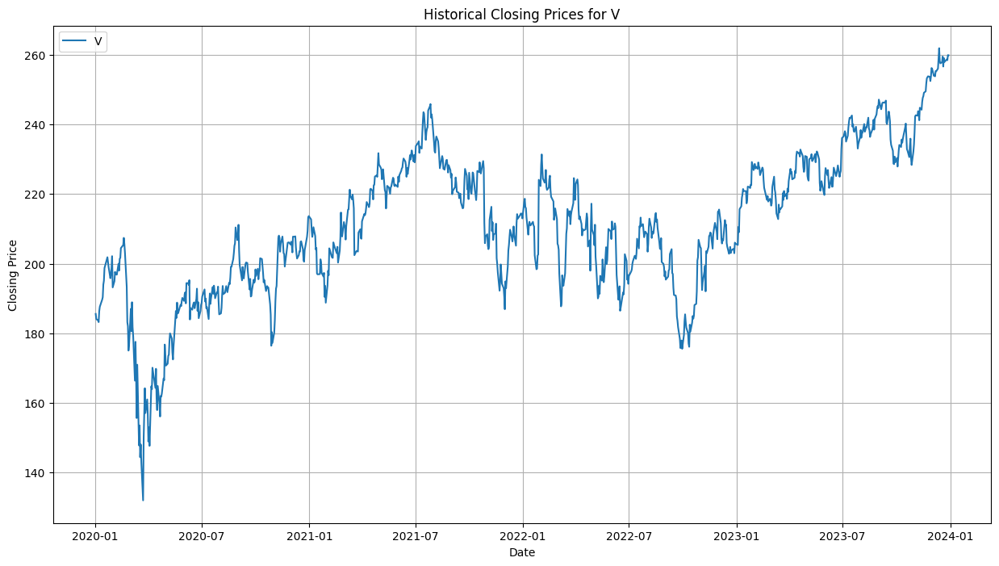

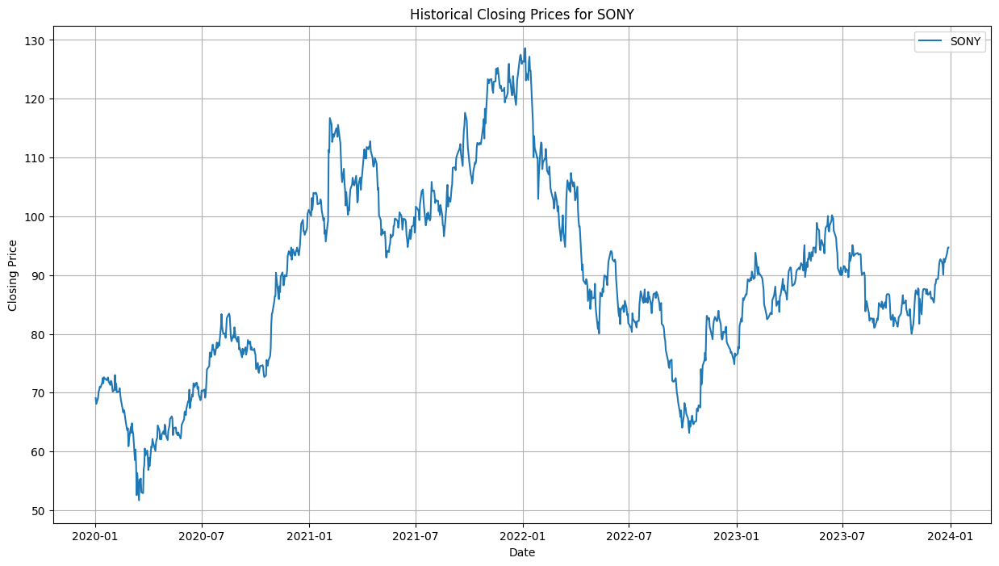

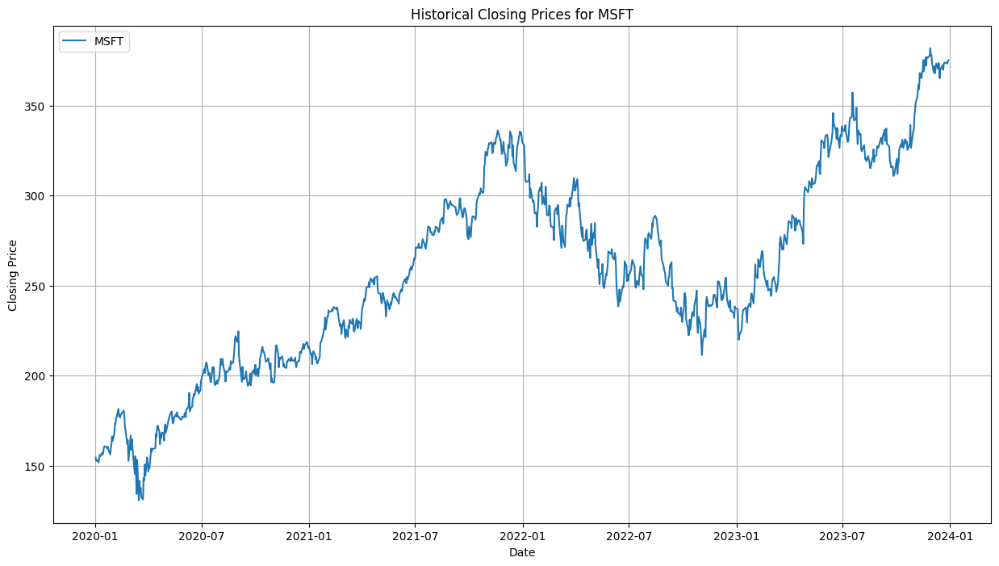

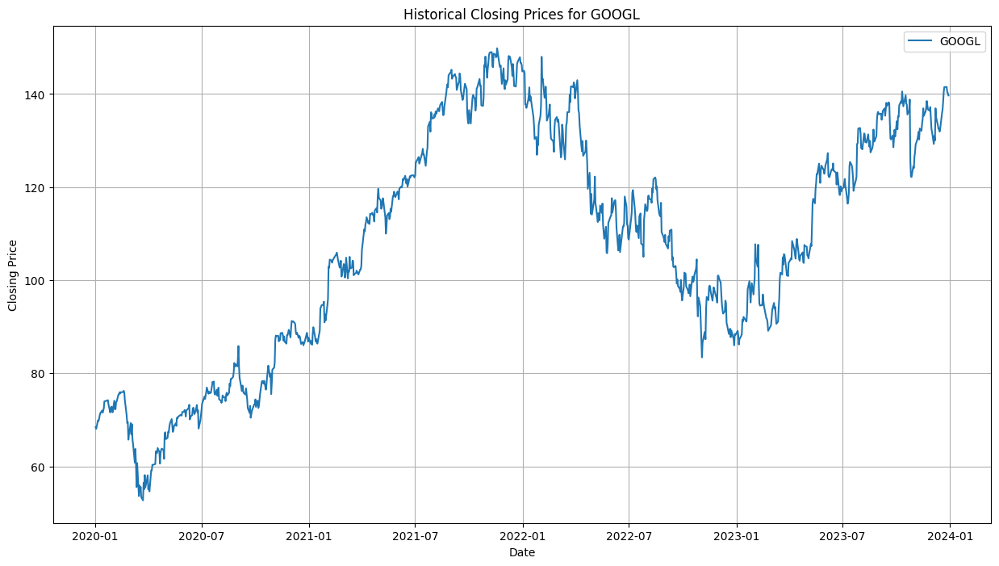

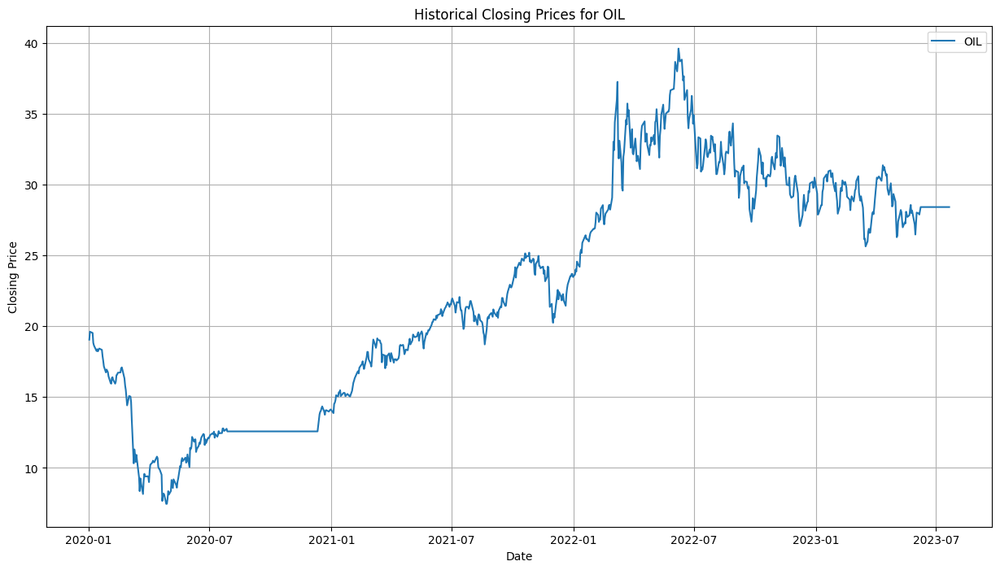

In [7]:
# Plot the historical closing prices for each ticker
for ticker in tickers:
    plt.figure(figsize=(15, 8))
    plt.plot(data[ticker].index, data[ticker].values, label=ticker)
    plt.title(f'Historical Closing Prices for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.grid(True)
    plt.show()

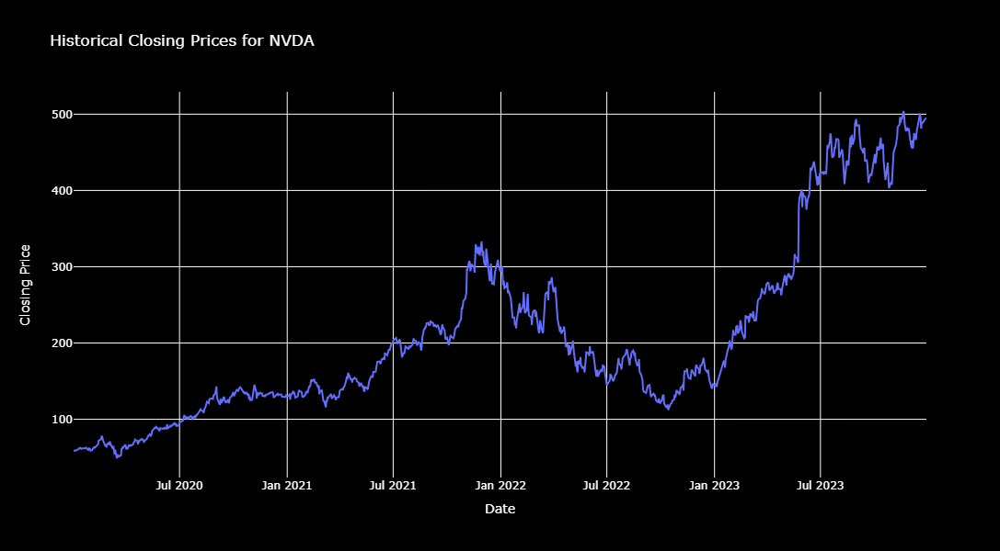

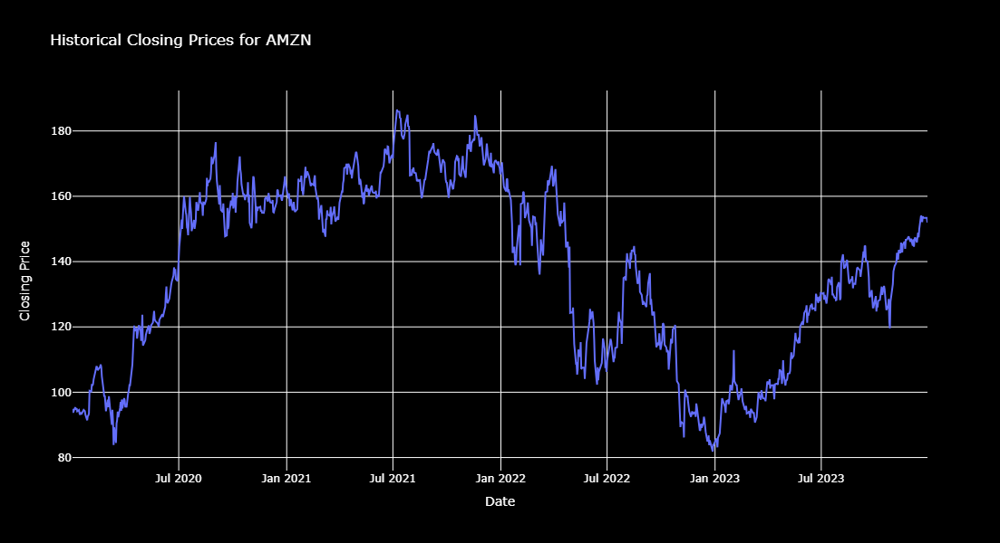

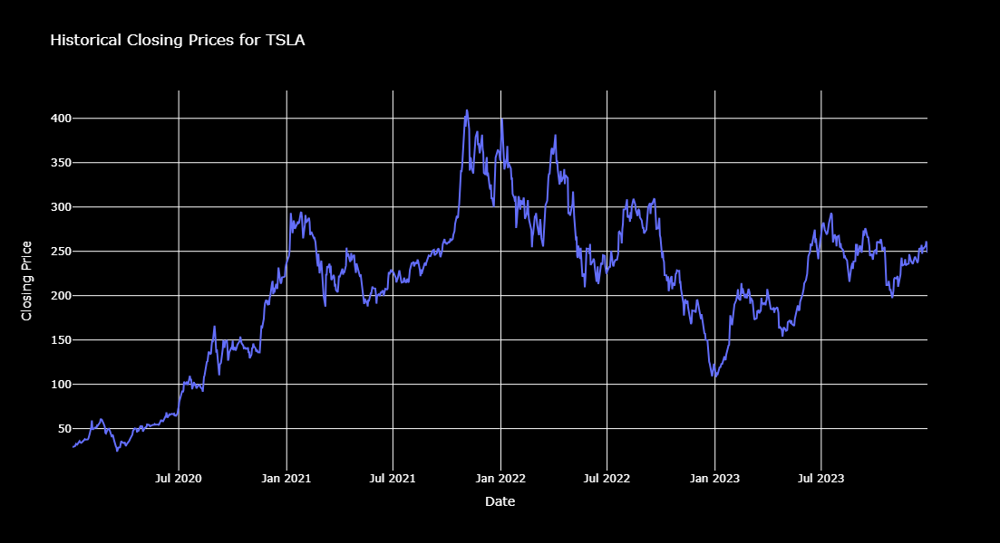

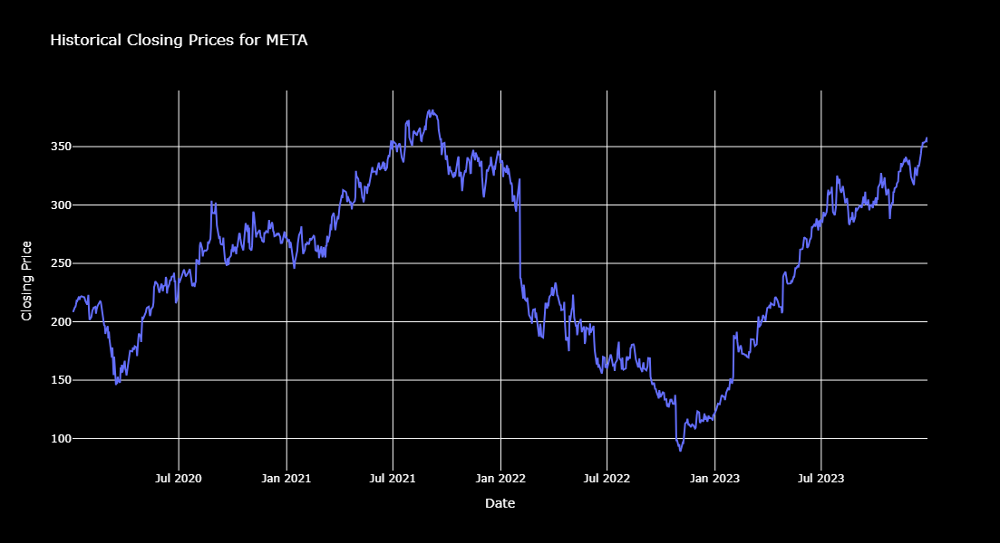

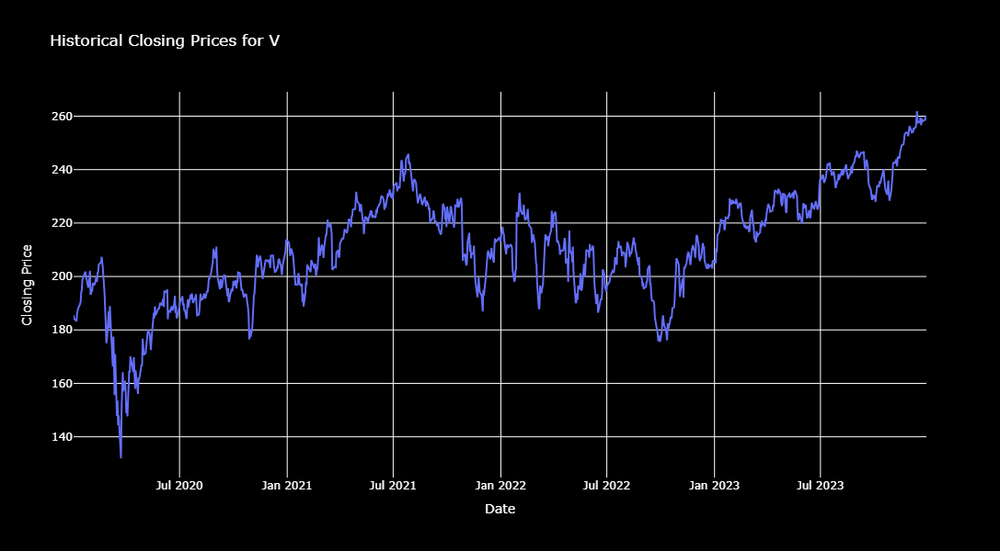

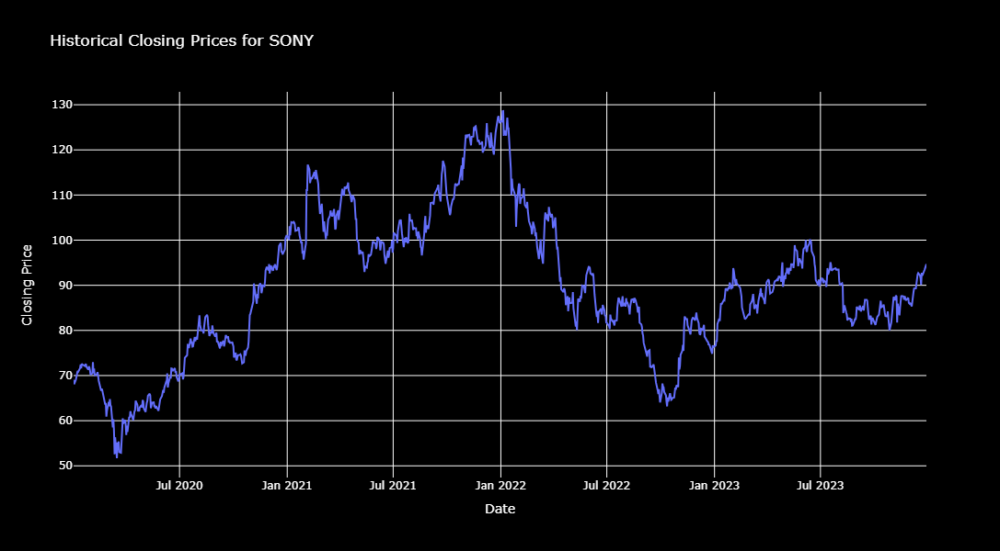

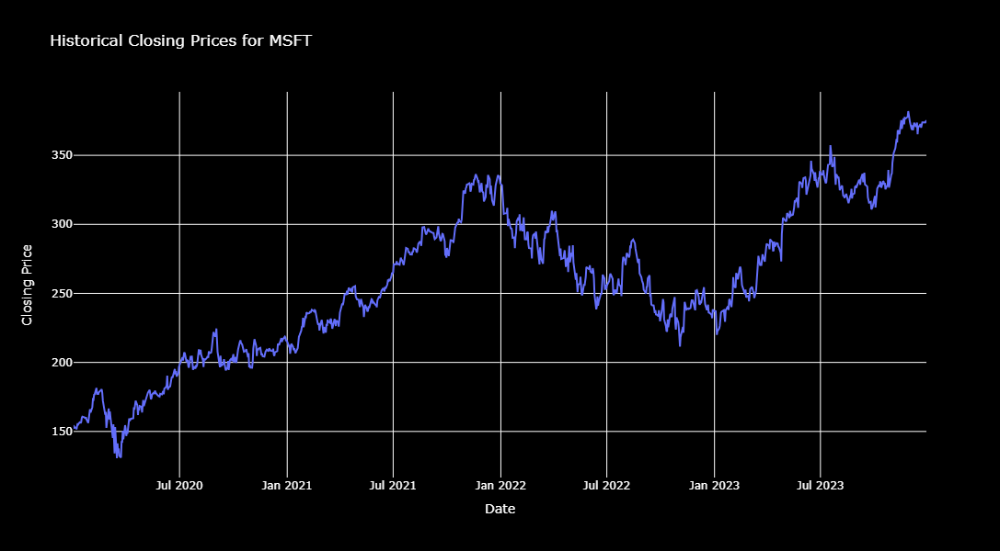

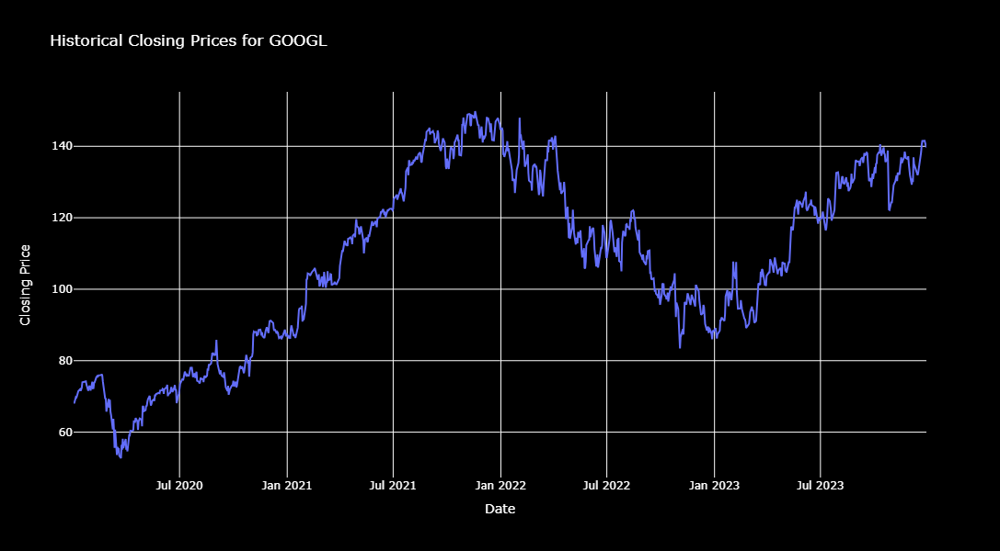

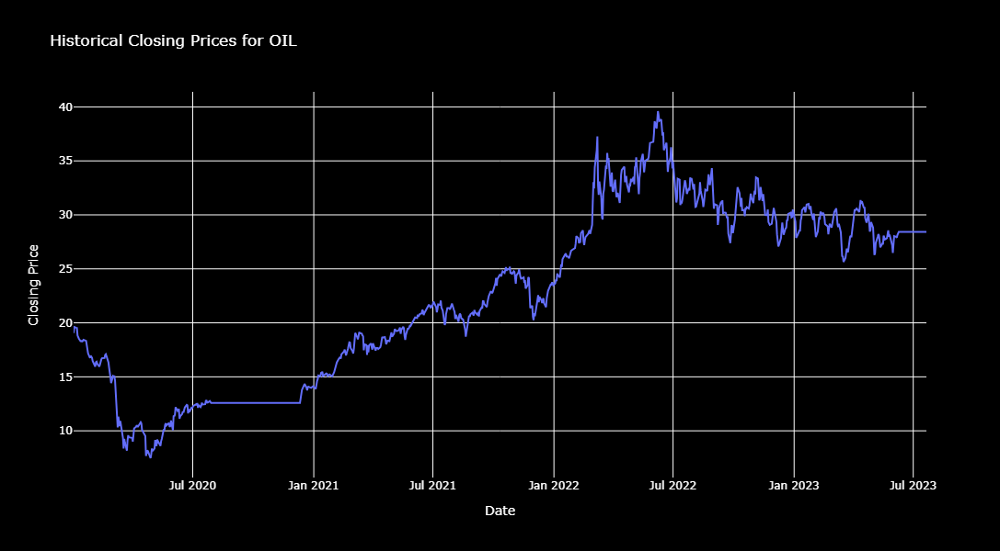

In [8]:
# Plot historical closing prices for each ticker
for ticker in tickers:
    # Create trace for the current ticker
    trace = go.Scatter(x=data[ticker].index, y=data[ticker].values, mode='lines', name=ticker)
    
    # Define layout for the current plot
    layout = go.Layout(
        title=f'Historical Closing Prices for {ticker}',
        xaxis=dict(title='Date'),
        yaxis=dict(title='Closing Price'),
        legend=dict(x=0.1, y=1.1),
        plot_bgcolor='black',  # Set background color to black
        paper_bgcolor='black',  # Set paper color to black
        font=dict(color='white'),  # Set font color to white
        autosize=True,
        width=1100,  # Set width of the plot
        height=600  # Set height of the plot
    )
    
    # Create figure for the current plot
    fig = go.Figure(data=[trace], layout=layout)
    
    # Show plot for the current ticker
    fig.show()

In [9]:
# Create input and output sequences
def create_sequences(data, seq_length=50):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)



In [10]:
X_train = {}
y_train = {}
X_test = {}
y_test = {}

for ticker in tickers:
    X_train[ticker], y_train[ticker] = create_sequences(train_data[ticker], seq_length)
    X_test[ticker], y_test[ticker] = create_sequences(test_data[ticker], seq_length)



In [11]:
# Create a folder to store saved models
os.makedirs(saved_models_folder, exist_ok=True)



In [12]:
models = {}
for ticker in tickers:
    model_path = os.path.join(saved_models_folder, f'{ticker}.h5')
    if retrain_models or not os.path.exists(model_path):
        # Train a new model and save it
        models[ticker] = Sequential()
        models[ticker].add(LSTM(lstm_units, input_shape=(seq_length, 1)))
        models[ticker].add(Dense(dense_units))
        models[ticker].compile(optimizer='adam', loss='mean_squared_error')
        early_stop = EarlyStopping(monitor='val_loss', patience=patience)
        models[ticker].fit(X_train[ticker], y_train[ticker], validation_data=(X_test[ticker], y_test[ticker]), batch_size=batch_size, epochs=epochs, callbacks=[early_stop])
        models[ticker].save(model_path)
        print(f'Trained and saved new model for {ticker}')
    else:
        # Load the saved model
        models[ticker] = load_model(model_path)
        print(f'Loaded saved model for {ticker}')



Loaded saved model for NVDA
Loaded saved model for AMZN
Loaded saved model for TSLA
Loaded saved model for META
Loaded saved model for V
Loaded saved model for SONY
Loaded saved model for MSFT
Loaded saved model for GOOGL
Loaded saved model for OIL


5/5 [==============================] - 0s 7ms/step


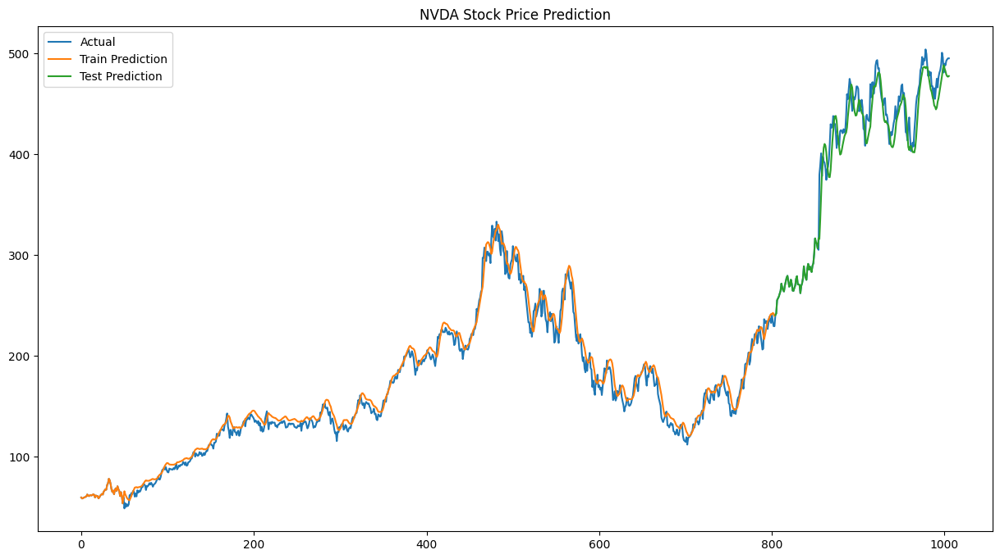

5/5 [==============================] - 0s 5ms/step


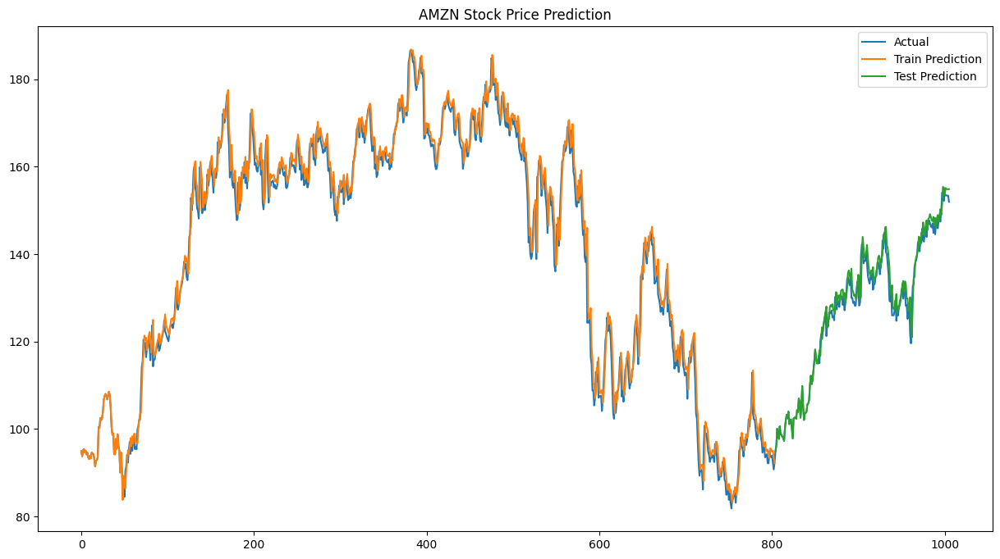

5/5 [==============================] - 0s 6ms/step


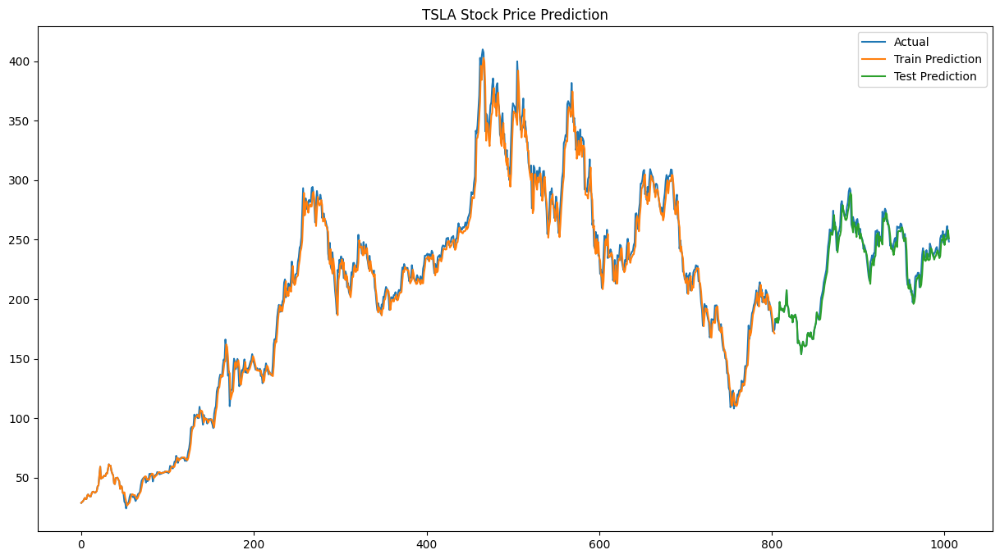

5/5 [==============================] - 0s 6ms/step


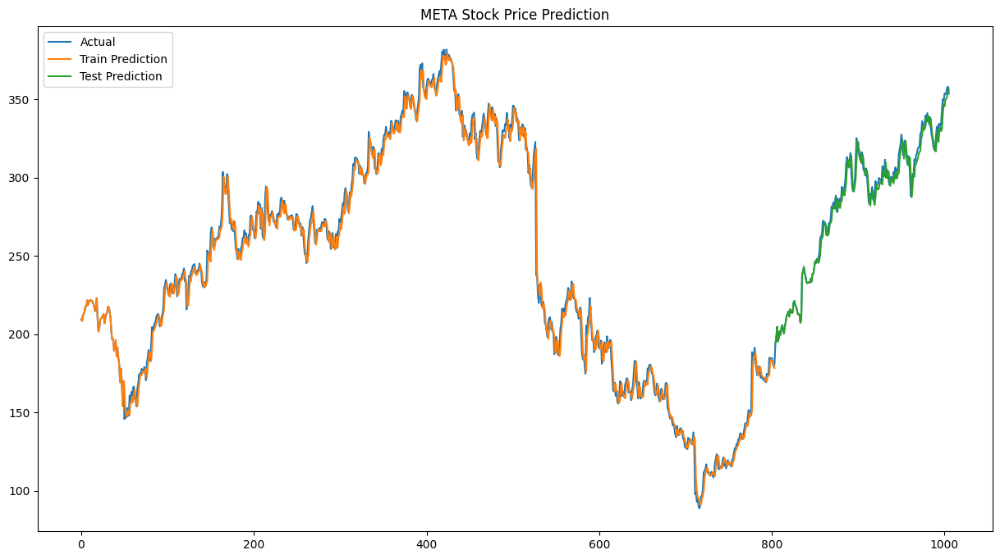

5/5 [==============================] - 0s 7ms/step


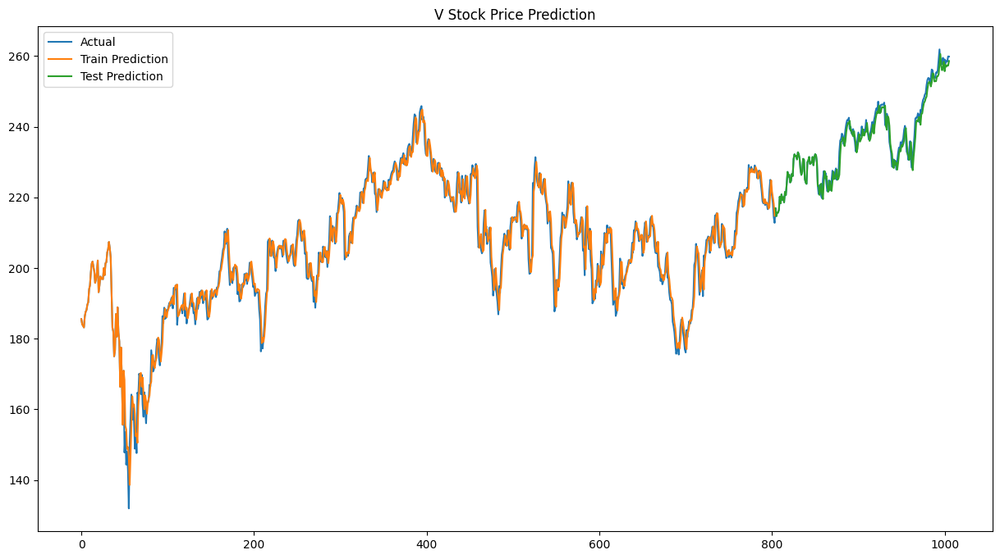

5/5 [==============================] - 0s 6ms/step


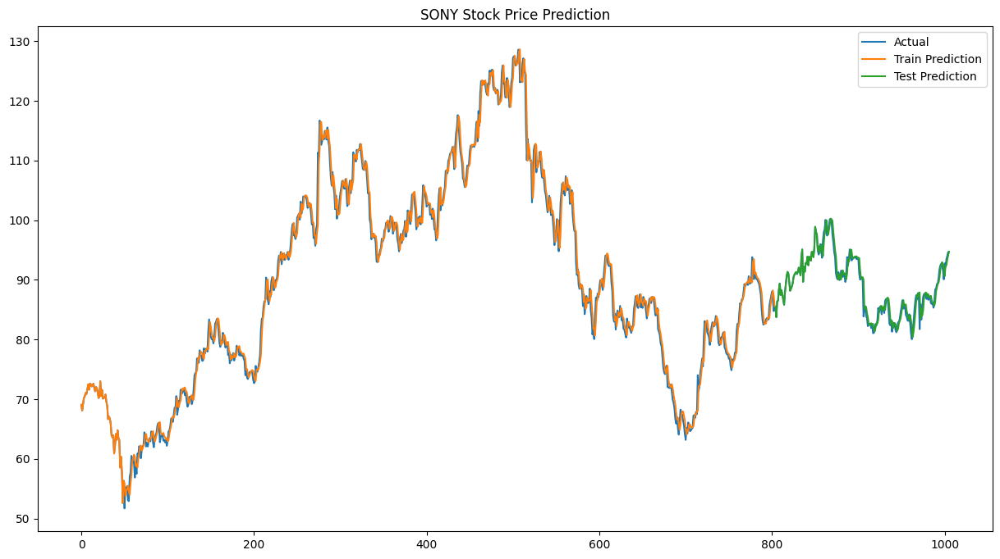

5/5 [==============================] - 0s 6ms/step


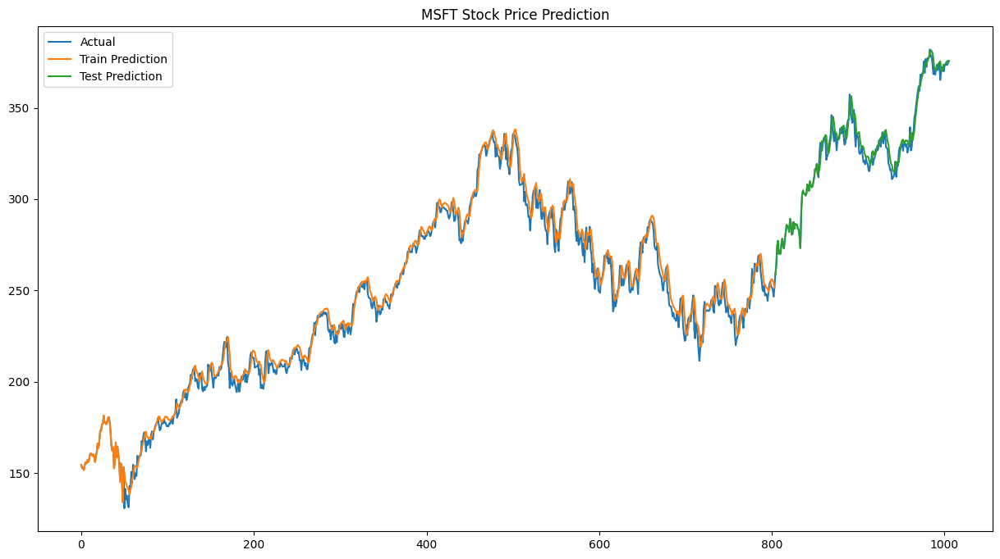

5/5 [==============================] - 0s 5ms/step


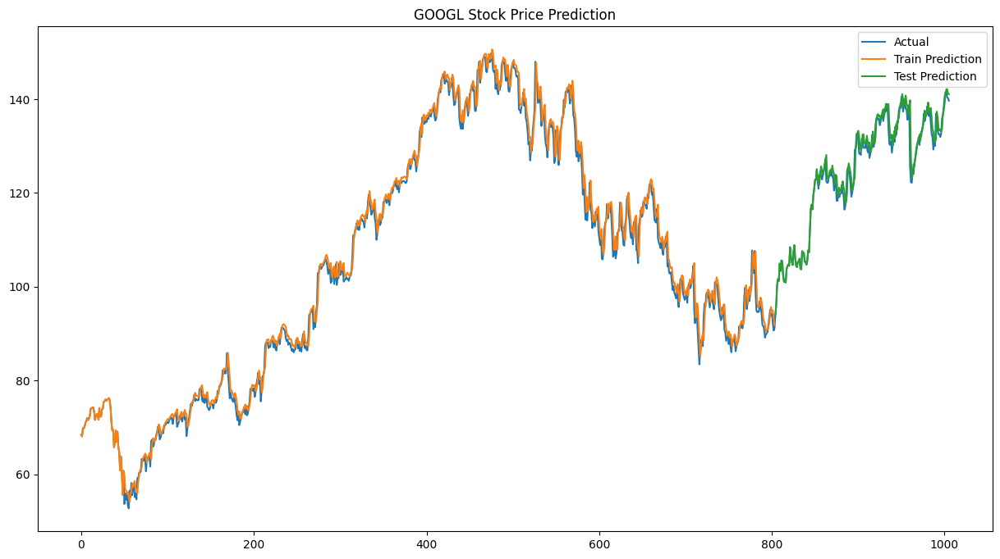

5/5 [==============================] - 0s 8ms/step


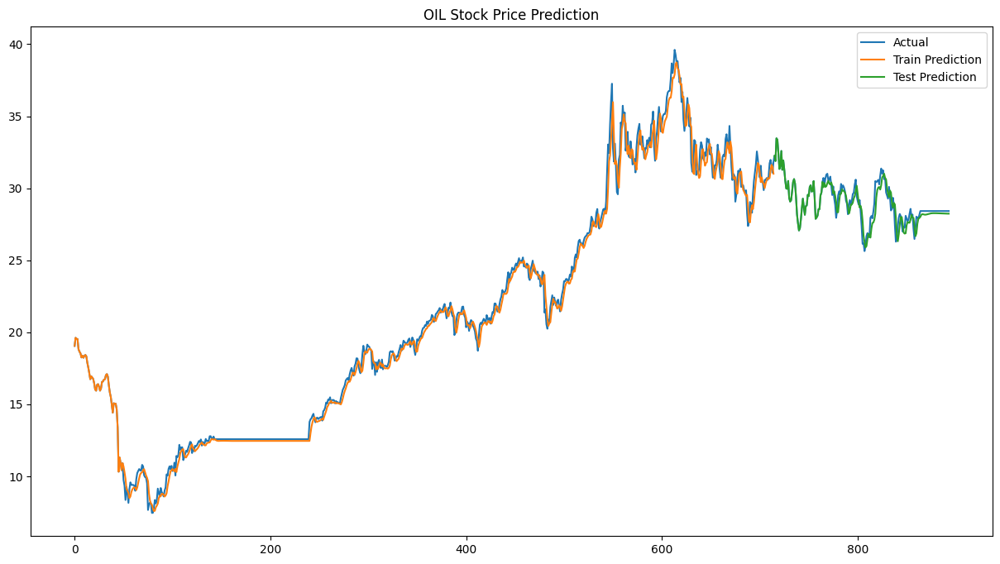

In [13]:
# Visualize the training and testing results
for ticker in tickers:
    plt.figure(figsize=(15, 8))
    scaler = MinMaxScaler().fit(data[ticker].values.reshape(-1, 1))
    plt.plot(scaler.inverse_transform(scaled_data[ticker]), label='Actual')
    train_predictions = np.concatenate((scaler.inverse_transform(train_data[ticker].reshape(-1, 1))[:seq_length],
                                        scaler.inverse_transform(models[ticker].predict(X_train[ticker]).reshape(-1, 1))))
    plt.plot(train_predictions, label='Train Prediction')
    test_predictions = np.concatenate((scaler.inverse_transform(test_data[ticker].reshape(-1, 1))[:seq_length],
                                       scaler.inverse_transform(models[ticker].predict(X_test[ticker]).reshape(-1, 1))))
    plt.plot(np.arange(len(train_predictions), len(train_predictions) + len(test_predictions)),
             test_predictions, label='Test Prediction')
    plt.title(f'{ticker} Stock Price Prediction')
    plt.legend()
    plt.show()


In [14]:

# Make future predictions
future_predictions = {}
for ticker in tickers:
    future_sequence = scaled_data[ticker][-seq_length:]
    future_predictions[ticker] = []
    for _ in range(future_periods):
        next_prediction = models[ticker].predict(future_sequence.reshape(1, seq_length, 1))
        future_predictions[ticker].append(next_prediction.reshape(-1))
        future_sequence = np.concatenate((future_sequence[1:], next_prediction.reshape(1, -1)), axis=0)



1/1 [==============================] - 0s 27ms/step


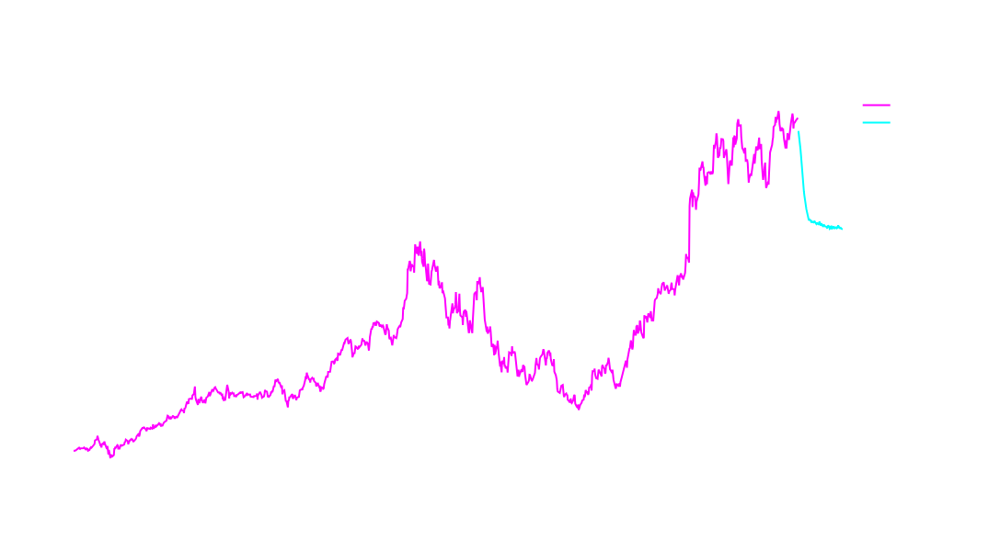

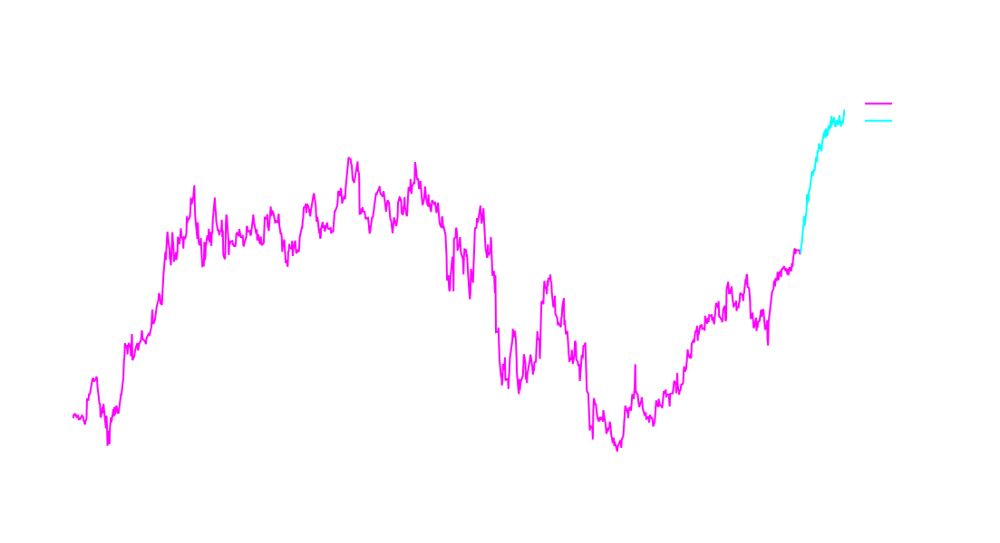

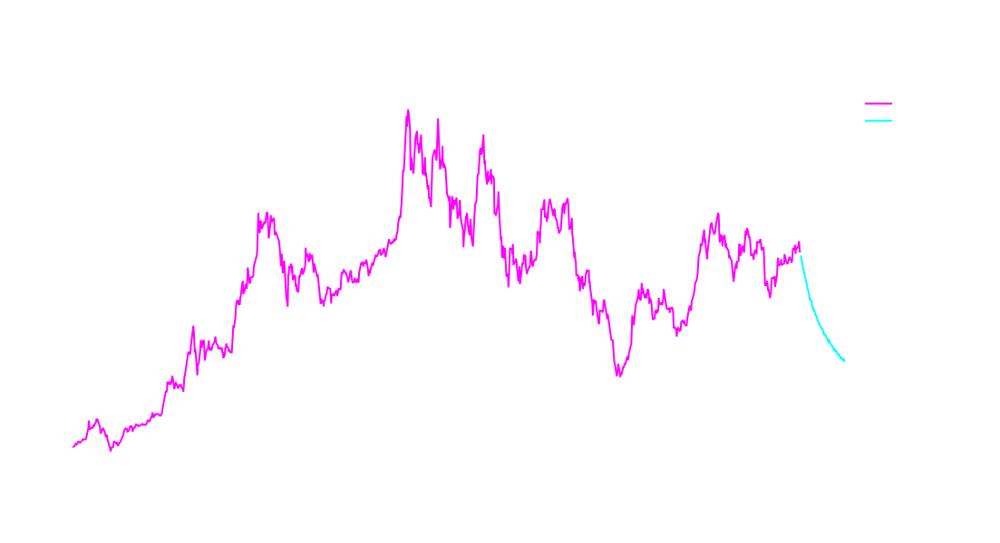

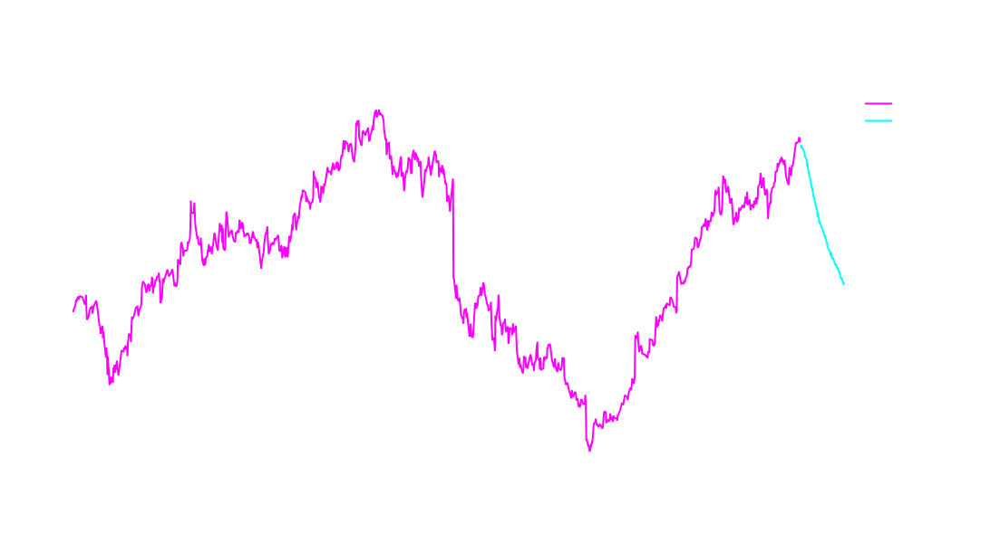

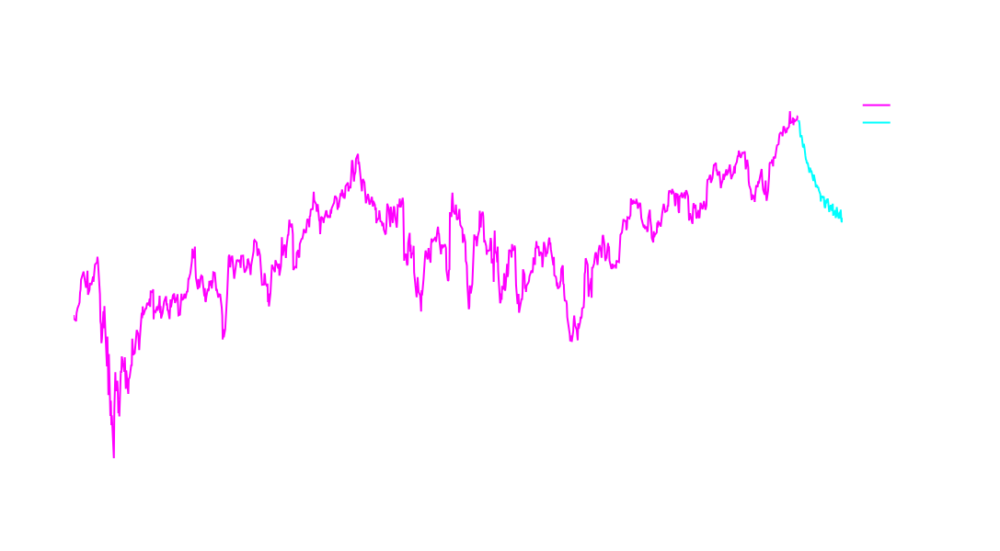

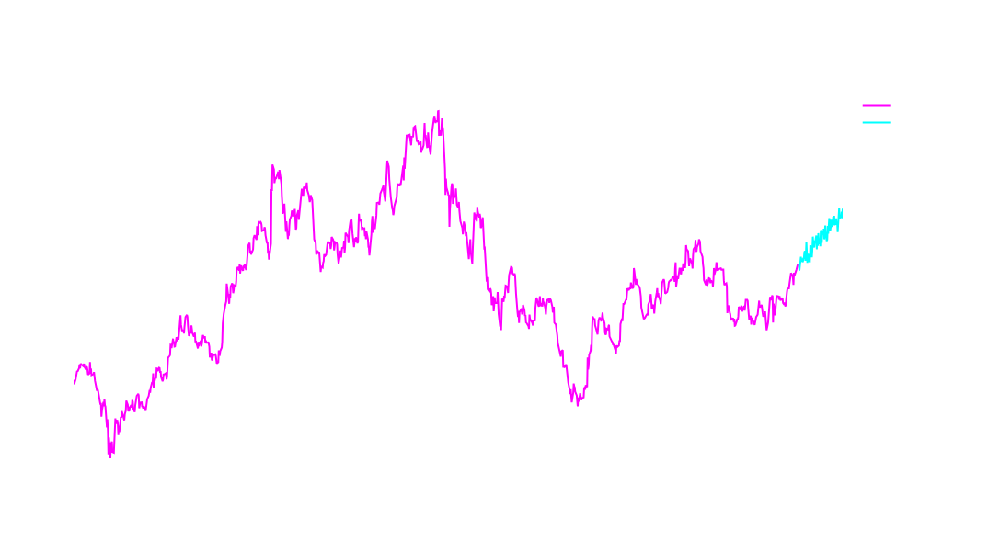

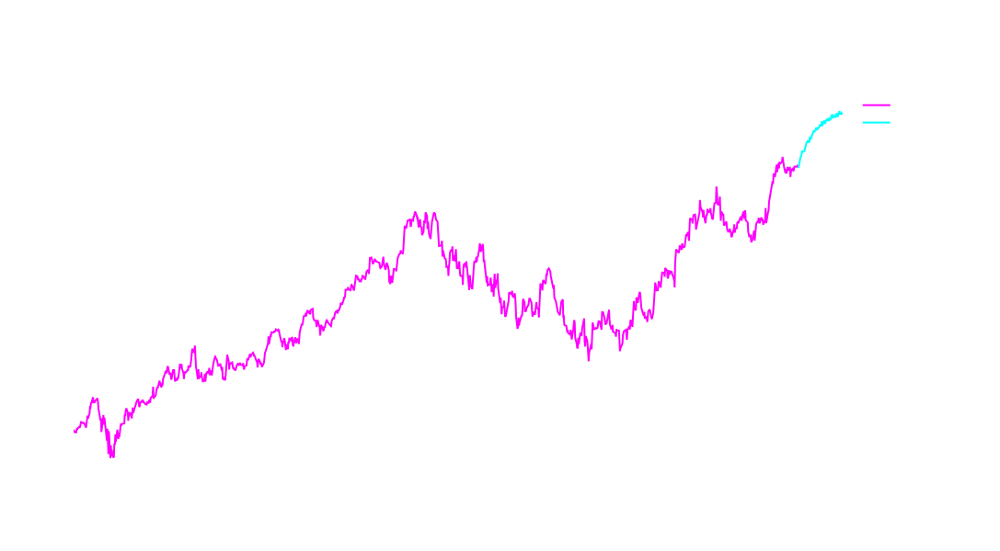

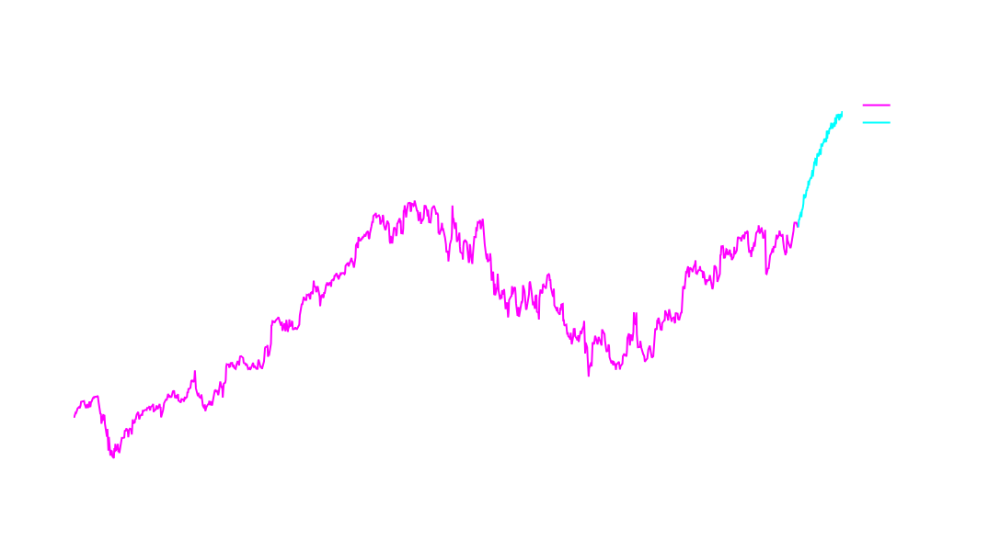

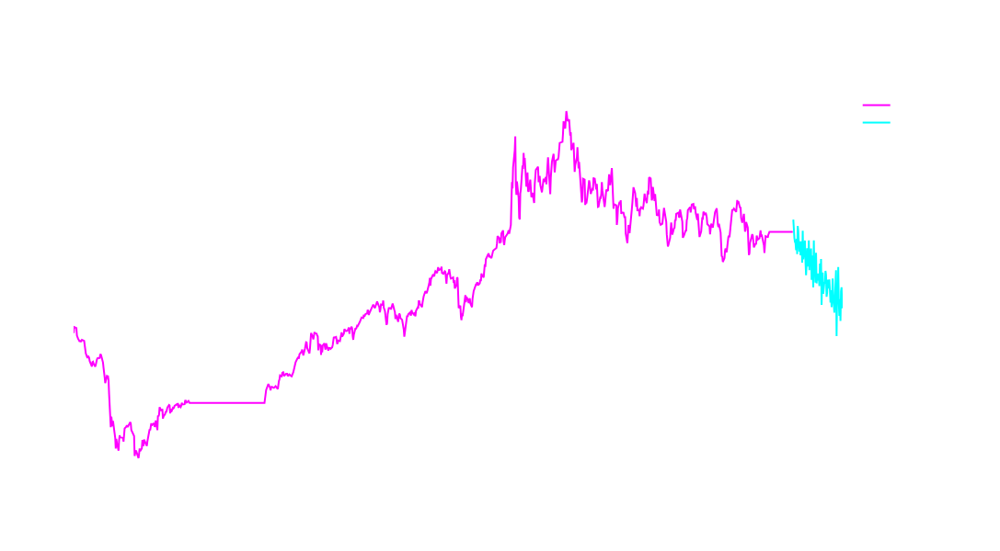

In [15]:

for ticker in tickers:
    scaler = MinMaxScaler().fit(data[ticker].values.reshape(-1, 1))
    future_predictions_scaled = np.concatenate((scaler.inverse_transform(scaled_data[ticker]),
                                                scaler.inverse_transform(np.array(future_predictions[ticker]).reshape(-1, 1))))
    future_dates = pd.date_range(start=data[ticker].index[-1], periods=len(future_predictions[ticker]) + 1, freq='D')[1:]
    
    # Apply noise to future predictions
    noise = np.random.normal(0, noise_factor, len(future_dates))
    noisy_future_predictions_scaled = future_predictions_scaled[len(scaled_data[ticker]):] + noise.reshape(-1, 1)
    
    fig = go.Figure()
    
    # Plot actual data
    fig.add_trace(go.Scatter(x=data[ticker].index, y=scaler.inverse_transform(scaled_data[ticker]).flatten(), mode='lines', name='Actual', line=dict(color='magenta')))
    
    # Plot future predictions with noise
    fig.add_trace(go.Scatter(x=future_dates, y=noisy_future_predictions_scaled.flatten(), mode='lines', name='Future Prediction', line=dict(color='cyan')))
    
    # Update layout using configuration values
    fig.update_layout(title=f'{ticker} Stock Price Prediction', xaxis_title='Date', yaxis_title='Stock Price', 
                      autosize=True,  # Enable responsive mode
                      margin=dict(autoexpand=True),  # Allow margins to auto expand for better fitting
                      plot_bgcolor='rgba(0,0,0,0)',
                      paper_bgcolor='rgba(0,0,0,0)',
                      font=dict(color='white'),
                      title_font_color="white",
                      xaxis=dict(showgrid=False),
                      yaxis=dict(showgrid=False),
                      width=1100,  # Set width of the plot
                      height=600,  # Set height of the plot
                      )
    
    # Show the plot
    fig.show()


In [16]:
# Your original code begins here
plots = []

for ticker in tickers:
    scaler = MinMaxScaler().fit(data[ticker].values.reshape(-1, 1))
    future_predictions_scaled = np.concatenate((scaler.inverse_transform(scaled_data[ticker]),
                                                scaler.inverse_transform(np.array(future_predictions[ticker]).reshape(-1, 1))))
    future_dates = pd.date_range(start=data[ticker].index[-1], periods=len(future_predictions[ticker]) + 1, freq='D')[1:]
    
    noise = np.random.normal(0, noise_factor, len(future_dates))
    noisy_future_predictions_scaled = future_predictions_scaled[len(scaled_data[ticker]):] + noise.reshape(-1, 1)
    
    source_actual = ColumnDataSource(data=dict(
        x=data[ticker].index,
        y=scaler.inverse_transform(scaled_data[ticker]).flatten()
    ))
    
    source_predicted = ColumnDataSource(data=dict(
        x=future_dates,
        y=noisy_future_predictions_scaled.flatten()
    ))

    p = figure(title=f'{ticker} Stock Price Prediction', x_axis_type='datetime', width=1100, height=600)
    p.line('x', 'y', source=source_actual, line_color='magenta', legend_label='Actual')
    p.line('x', 'y', source=source_predicted, line_color='cyan', legend_label='Future Prediction')
    p.legend.location = "top_left"
    p.background_fill_color = "black"
    p.title.text_color = "white"
    p.xaxis.axis_label = 'Date'
    p.yaxis.axis_label = 'Stock Price'

    plots.append([p])  # Append each plot as a single-item list

output_notebook()  # Set output to be displayed inline in the notebook
show(gridplot(plots))

Loading BokehJS ...

[*********************100%%**********************]  1 of 1 completed


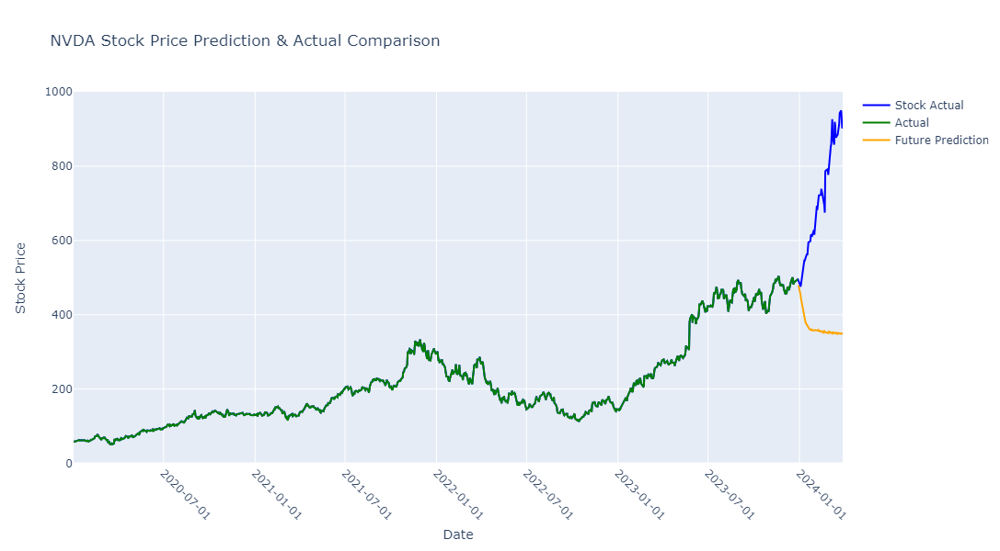

[*********************100%%**********************]  1 of 1 completed


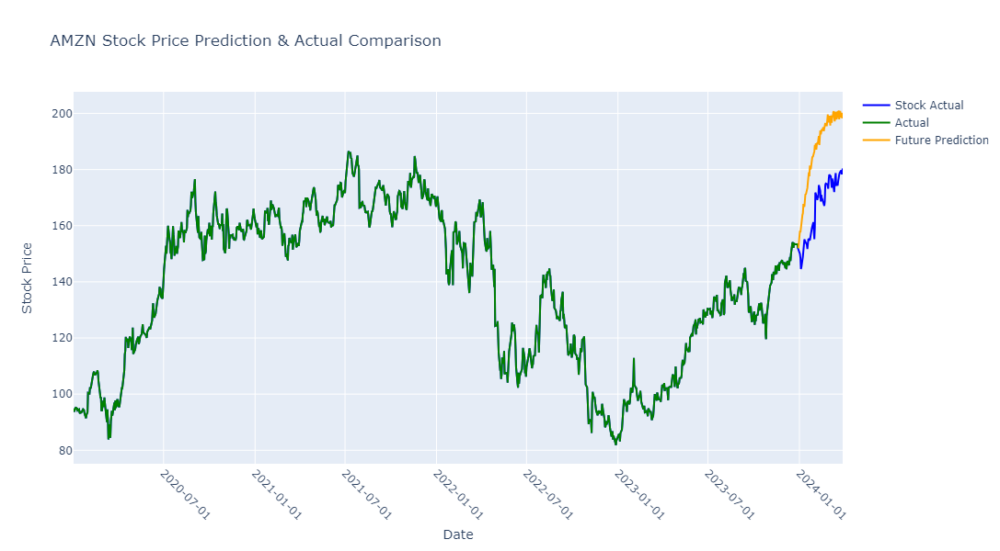

[*********************100%%**********************]  1 of 1 completed


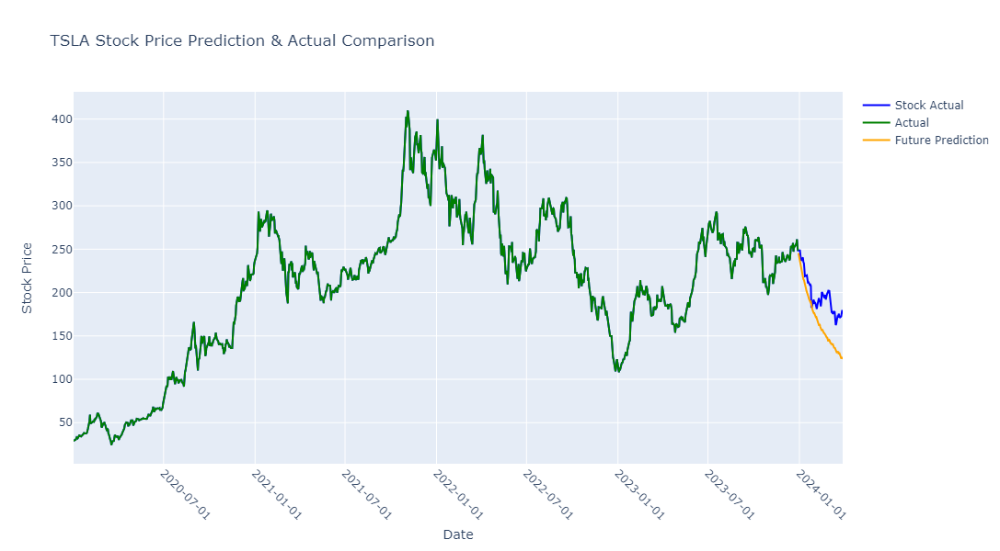

[*********************100%%**********************]  1 of 1 completed


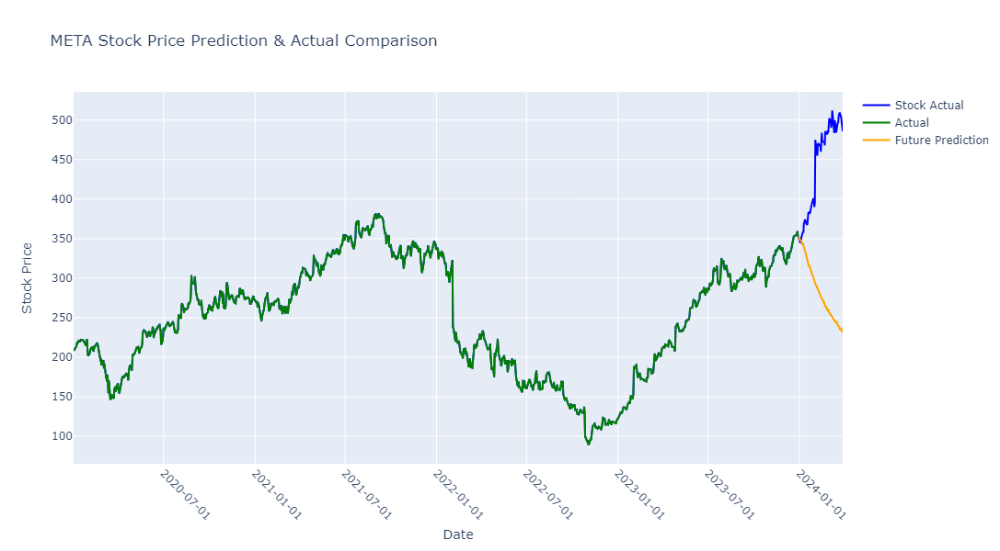

[*********************100%%**********************]  1 of 1 completed


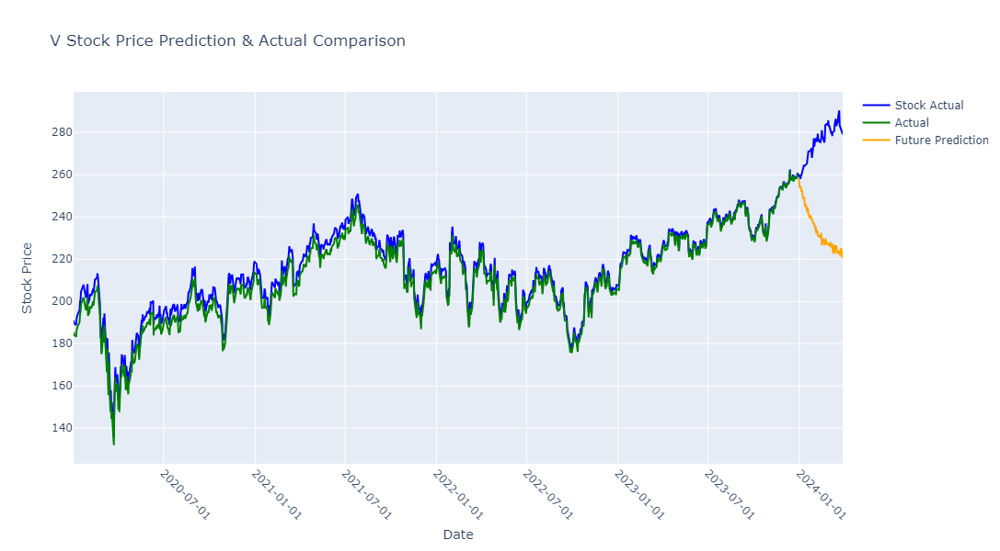

[*********************100%%**********************]  1 of 1 completed


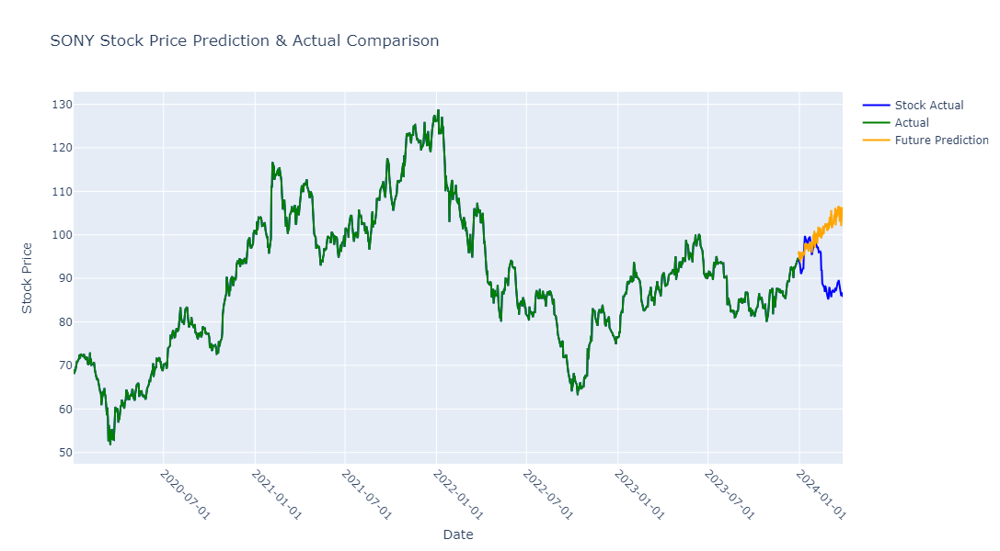

[*********************100%%**********************]  1 of 1 completed


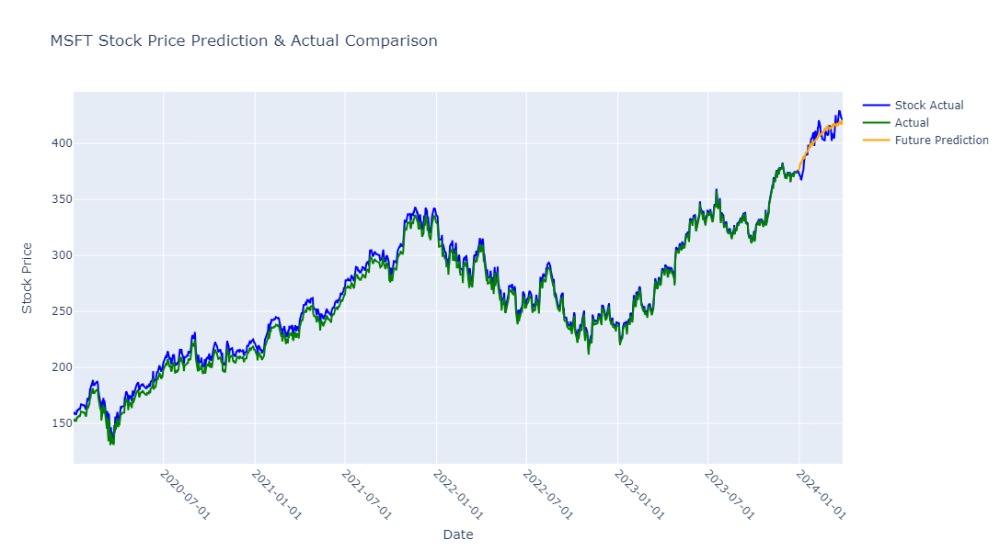

[*********************100%%**********************]  1 of 1 completed


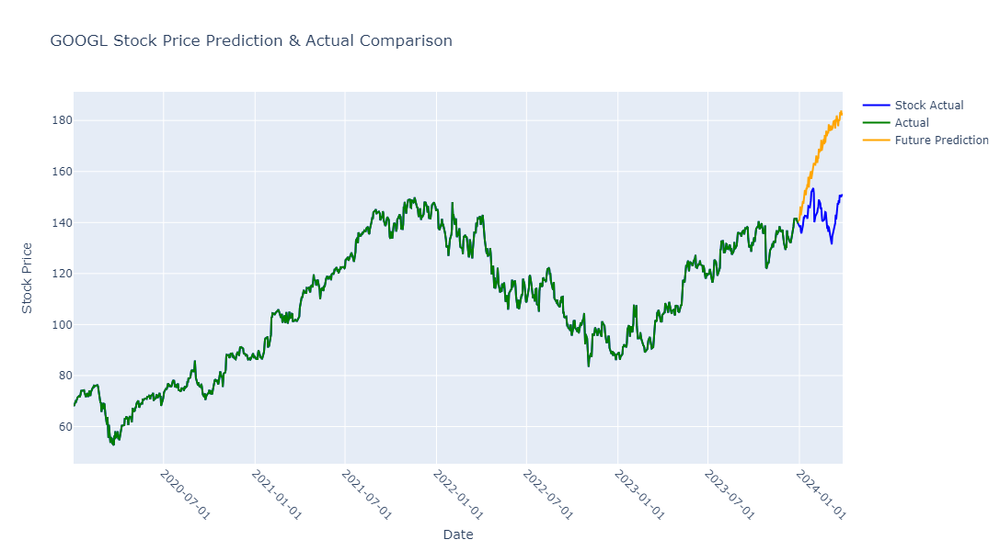

[*********************100%%**********************]  1 of 1 completed


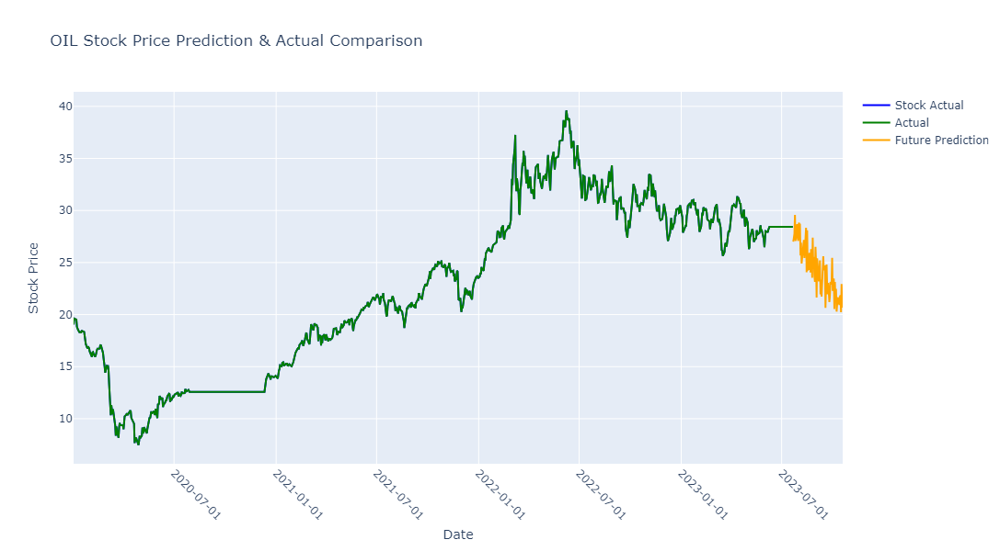

In [17]:
# Compare actual and predicted prices
for ticker in tickers:
    scaler = MinMaxScaler().fit(data[ticker].values.reshape(-1, 1))

    # Fetch actual data until 2024-03-31
    com_data = yf.download(ticker, start=start_date, end='2024-03-31')
    com_close_prices = com_data['Close'].dropna()

    # Create a new figure
    fig = go.Figure()

    # Plot actual data from yfinance
    fig.add_trace(go.Scatter(x=com_close_prices.index, y=com_close_prices, mode='lines', name='Stock Actual', line=dict(color='blue', width=2)))

    # Plot actual data used for training
    fig.add_trace(go.Scatter(x=data[ticker].index, y=scaler.inverse_transform(scaled_data[ticker]).flatten(), mode='lines', name='Actual', line=dict(color='green', width=2)))

    # Plot future predictions with added noise
    future_predictions_scaled = np.concatenate((scaler.inverse_transform(scaled_data[ticker]), scaler.inverse_transform(np.array(future_predictions[ticker]).reshape(-1, 1))))
    future_dates = pd.date_range(start=data[ticker].index[-1], periods=len(future_predictions[ticker]) + 1, freq='D')[1:]
    noise = np.random.normal(0, noise_factor, len(future_dates))
    noisy_future_predictions_scaled = future_predictions_scaled[len(scaled_data[ticker]):] + noise.reshape(-1, 1)
    fig.add_trace(go.Scatter(x=future_dates, y=noisy_future_predictions_scaled.flatten(), mode='lines', name='Future Prediction', line=dict(color='orange', width=2)))

    # Update layout
    fig.update_layout(
        title=f'{ticker} Stock Price Prediction & Actual Comparison',
        xaxis_title='Date',
        yaxis_title='Stock Price',
        xaxis_tickformat='%Y-%m-%d',
        xaxis_tickangle=45,
        width=1100,
        height=600,
        showlegend=True
    )

    # Display the plot
    fig.show()
